<a href="https://colab.research.google.com/github/Nyamadie/Loss-analysis/blob/main/New_Channels_Update.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Packages

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd ''

/content/drive/.shortcut-targets-by-id/1zgbI4HtAh4L5VsbEGVeF9fSUylAVhvLx/QFHD


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving patient_data (11).csv to patient_data (11) (3).csv


In [ ]:
import pickle
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.signal import find_peaks
from qf_plus_shared.src.signal_processing import *
sys.path.append('')
import scipy.signal

# Data Preprocessing

In [ ]:
pickle_file_path = ''
patient_file_path = ''

with open(pickle_file_path, 'rb') as file:
    signal_data = pickle.load(file)

df = pd.read_csv(patient_file_path)
filtered_df = df[df['Data QA'] >= 0.4].dropna(subset=['z_score'])
filenames = filtered_df['filenames'].tolist()

ppg_signals_df = signal_data['file_data']

# Extract signals corresponding to 10 filenames
selected_filenames = filenames[:30]
selected_signals = []
for filename in selected_filenames:
    if filename in ppg_signals_df:
        signal_data = ppg_signals_df[filename]

        # Check if both 'env_scaled' and 'filt_cycle' exist
        if 'env_scaled' in signal_data and 'filt_cycle' in signal_data:
            selected_signals.append(signal_data['env_scaled'].values)
        else:
            print(f"Missing 'env_scaled' or 'filt_cycle' in {filename}")
    else:
        print(f"File {filename} not found in PPG signals.")

# Check for the first 5 files
#for filename in selected_filenames[:5]:  # Adjust to target specific warnings
#    if filename not in ppg_signals_df:
#        print(f"File {filename} not found in the dataset.")
#    else:
#       print(f"Keys in {filename}: {ppg_signals_df[filename].keys()}")


# K's Peak Finder

In [ ]:
! pip install emd -q
import emd

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.3/237.3 kB 8.6 MB/s eta 0:00:00


In [ ]:
def find_element_indexes(long_list, target_list):
  """
  Finds the indexes of elements in the target list within the long list.

  Args:
      long_list: A list containing elements.
      target_list: A list containing elements to search for.

  Returns:
      A list containing the indexes of the elements in the target list found in the long list.
  """
  results = []
  for element in target_list:
    try:
      # Use index() to find the first occurrence of the element
      index = long_list.index(element)
      results.append(index)
    except ValueError:
      # Element not found, append None
      results.append(None)
  return results

def extract_cycles_peaks_troughs(
    imf: np.ndarray, all_cycles: np.ndarray
) -> Tuple[List[np.ndarray], List[float], List[float]]:
    import emd

    """
    Extract cycles, peaks, and troughs from the best IMF.

    Args:
        imf (numpy.ndarray): IMF data.
        all_cycles (numpy.ndarray): Cycle data.

    Returns:
        tuple: Lists of cycles, peaks, and troughs.
    """
    ctrl = emd.cycles.get_control_points(imf[:, 0], all_cycles[:, 0])
    ncycles = len(ctrl)
    cycles, peaks, troughs, peak_values, valley_values = [], [], [], [], []

    for ii in range(ncycles):
        cycle = imf[all_cycles[:, 0] == ii, 0]
        for jj in range(5):
            if np.isfinite(ctrl[ii, jj]):
                if jj == 1:
                    peaks.append(ctrl[ii, jj])
                    peak_values.append(cycle[int(ctrl[ii, jj])])  # Access peak value
                if jj == 3:
                    troughs.append(ctrl[ii, jj])
                    valley_values.append(cycle[int(ctrl[ii, jj])])  # Access valley value
        cycles.append(cycle)

    return cycles, peaks, troughs, peak_values, valley_values

def bob_cycles_gen(peaks, valleys):
    """
    Finds cycles based on peaks and valleys.

    Args:
        peaks (numpy.ndarray): Array of peak values.
        valleys (numpy.ndarray): Array of valley values.

    Returns:
        numpy.ndarray: Array of cycles, where each cycle is represented as [start_valley, first_peak, NaN, end_valley].
    """
    if peaks.size > 1 and valleys.size > 1:
        cycles = []
        avg_period = np.mean(np.concatenate((np.diff(peaks), np.diff(valleys))))
        for val_idx in range(len(valleys) - 1):
            rel_dist = (valleys[val_idx + 1] - valleys[val_idx]) / avg_period
            if 0.33 <= rel_dist <= 2.00:
                peaks_btwn = peaks[(peaks > valleys[val_idx]) & (peaks < valleys[val_idx + 1])]
                if len(peaks_btwn) > 0:
                    cycles.append([valleys[val_idx], peaks_btwn[0], np.nan, valleys[val_idx + 1]])
    elif peaks.size == 1 and valleys.size == 0:
        cycles = [[np.nan, peaks[0], np.nan, np.nan]]
    elif valleys.size == 1 and peaks.size == 0:
        cycles = [[valleys[0], np.nan, np.nan, np.nan]]
    elif peaks.size == 1 and valleys.size == 1:
        if valleys[0] < peaks[0]:
            cycles = [[valleys[0], peaks[0], np.nan, np.nan]]
        else:
            cycles = [[np.nan, peaks[0], np.nan, valleys[0]]]
    else:
        cycles = np.empty((0, 4))

    return np.array(cycles)

## Resampling

In [ ]:
def process_signals(ppg_signals_df, selected_filenames, target_length=50):
    stretched_signals = {}  # Channel 1
    stretching_factors = {}  # Channel 2
    subtracted_signals = {}

    for filename in selected_filenames:
        if filename not in ppg_signals_df:
            print(f"Warning: {filename} not found.")
            continue

        # First, process the filt_cycle data to detect peaks
        data = ppg_signals_df[filename]['filt_cycle']
        ppg = data.to_numpy()

        # Perform EMD processing
        imf, all_cycles = perform_emd(ppg)
        best_imf_idx = find_best_imf(imf, all_cycles)
        imf, all_cycles = sum_imfs(imf, all_cycles, best_imf_idx)
        all_cycles = recalculate_cycles(imf, len(ppg))
        cycles, peaks, troughs, peak_values, valley_values = extract_cycles_peaks_troughs(imf, all_cycles)

        # Convert IMF to list for finding indexes
        imf_list = imf[:, 0].tolist()
        peaks_idx = find_element_indexes(imf_list, peak_values)
        valleys_idx = find_element_indexes(imf_list, valley_values)

        # Generate Bob cycles
        bob_cycles = bob_cycles_gen(np.array(peaks_idx), np.array(valleys_idx))

        # Now use env_scaled for actual segmentation
        data1 = ppg_signals_df[filename]['env_scaled']
        env_scaled = data1.values

        # store results for this file
        if filename not in stretched_signals:
            stretched_signals[filename] = []
            stretching_factors[filename] = []

        # Process each cycle
        resampled_heartbeats = []
        cycle_stretching_factors = []

        for cycle in bob_cycles:
            # Extract start and end indexes, handling potential NaN values
            start = int(cycle[0]) if not np.isnan(cycle[0]) else None
            peak = int(cycle[1]) if not np.isnan(cycle[1]) else None
            end = int(cycle[3]) if not np.isnan(cycle[3]) else None

            if start is None or end is None or peak is None:
                continue

            # Extract the heartbeat segment
            heartbeat = env_scaled[start:end]

            # Calculate the stretching factor
            original_length = len(heartbeat)
            stretch_factor = original_length / target_length

            # Resample the heartbeat to target length
            resampled_heartbeat = resample_interp_nb(heartbeat, target_length)

            # Store the results
            resampled_heartbeats.append(resampled_heartbeat)
            cycle_stretching_factors.append(stretch_factor)

        # Concatenate the resampled heartbeats
        if resampled_heartbeats:
            concatenated_signal = np.concatenate(resampled_heartbeats)

            # Resample the concatenated signal back to the original signal length
            final_resampled_signal = resample_interp_nb(concatenated_signal, len(env_scaled))

            subtracted_signal = env_scaled - final_resampled_signal

            stretched_signals[filename] = final_resampled_signal
            stretching_factors[filename] = cycle_stretching_factors
            subtracted_signals[filename] = subtracted_signal

    return stretched_signals, stretching_factors, subtracted_signals

# Signal length

In [ ]:
# prompt: what is the cummulated length of the stretched signal for this filename ' stretched_signals['AA 05.28.21.2.csv']'

import numpy as np

# Assuming 'stretched_signals' and 'selected_filenames' are defined from your previous code
# Example usage (replace with your actual data)
# Assuming stretched_signals is already populated as in your code
total_length = 0
if 'AA 05.28.21.2.csv' in stretched_signals:
  for signal in stretched_signals['AA 05.28.21.2.csv']:
    total_length += len(signal)
  print(f"The cumulated length of the stretched signal for 'AA 05.28.21.2.csv' is: {total_length}")
else:
  print(f"File 'AA 05.28.21.2.csv' not found in stretched_signals.")

In [ ]:
# prompt: give the lengths of the first 3 filenames for the stretched_signals

# Assuming 'stretched_signals' and 'selected_filenames' are defined from your previous code
# Example usage (replace with your actual data)

# Assuming stretched_signals is already populated as in your code
print("Lengths of the first 3 filenames for the stretched signals:")

for filename in selected_filenames[:3]:
    if filename in stretched_signals:
        signal = stretched_signals[filename]
        if isinstance(signal, list):
          total_length = sum(len(s) for s in signal)
          print(f"The cumulated length of the stretched signal for '{filename}' is: {total_length}")
        else:
          print(f"The length of the stretched signal for '{filename}' is: {len(signal)}")
    else:
        print(f"File '{filename}' not found in stretched_signals.")

Lengths of the first 3 filenames for the stretched signals:
The length of the stretched signal for 'AA 05.28.21.2.csv' is: 2851
The length of the stretched signal for 'AA 05.28.21.3.csv' is: 2781
The length of the stretched signal for 'AG 07.06.21.1.csv' is: 2682


In [ ]:
len(stretched_signals['AA 05.28.21.2.csv'])

2851

In [ ]:
print("Lengths of the first 3 filenames for the ppg_signals_df:")

for filename in selected_filenames[:3]:
    if filename in ppg_signals_df:
        signal = ppg_signals_df[filename]
        if isinstance(signal, list):
          total_length = sum(len(s) for s in signal)
          print(f"The cumulated length of the ppg_signals_df for '{filename}' is: {total_length}")
        else:
          print(f"The length of the ppg_signals_df for '{filename}' is: {len(signal)}")
    else:
        print(f"File '{filename}' not found in ppg_signals_df.")

Lengths of the first 3 filenames for the ppg_signals_df:
The length of the ppg_signals_df for 'AA 05.28.21.2.csv' is: 2851
The length of the ppg_signals_df for 'AA 05.28.21.3.csv' is: 2781
The length of the ppg_signals_df for 'AG 07.06.21.1.csv' is: 2682


In [ ]:
original = len(ppg_signals_df['AA 05.28.21.2.csv'])
print(f'original length is: {original}')

original length is: 2851


# Applying the Function

In [ ]:
# Apply the function
stretched_signals, stretching_factors, subtracted_signals = process_signals(ppg_signals_df, selected_filenames)

In [ ]:
# Inspecting one file's results
example_file = selected_filenames[6]
example_resampled = stretched_signals[example_file]
example_factors = stretching_factors[example_file]

In [ ]:
# Plot one resampled signal
plt.figure(figsize=(10, 6))
plt.plot(example_resampled[0], label='Resampled Heartbeat')
plt.title(f"Resampled Signal - {example_file}")
plt.legend()
plt.show()

# Single Visuals

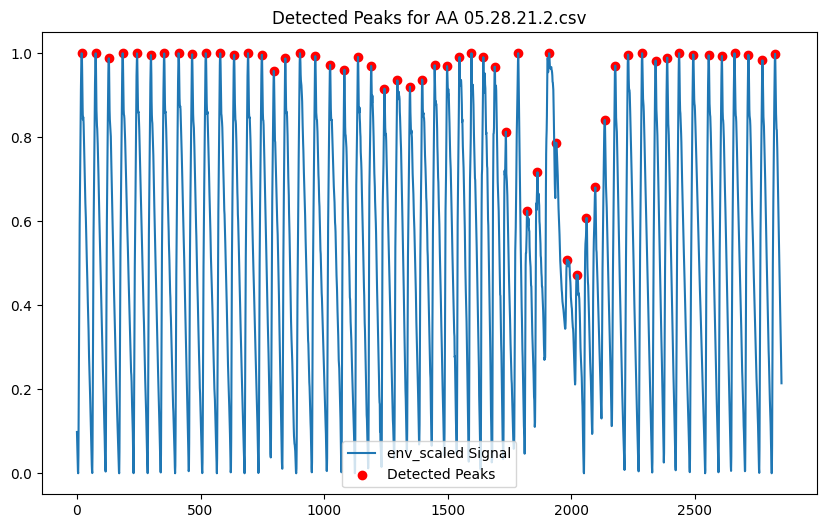

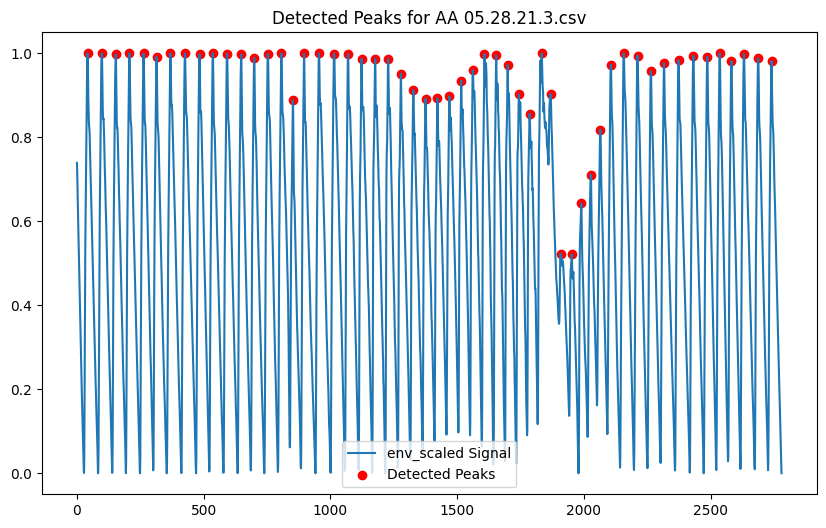

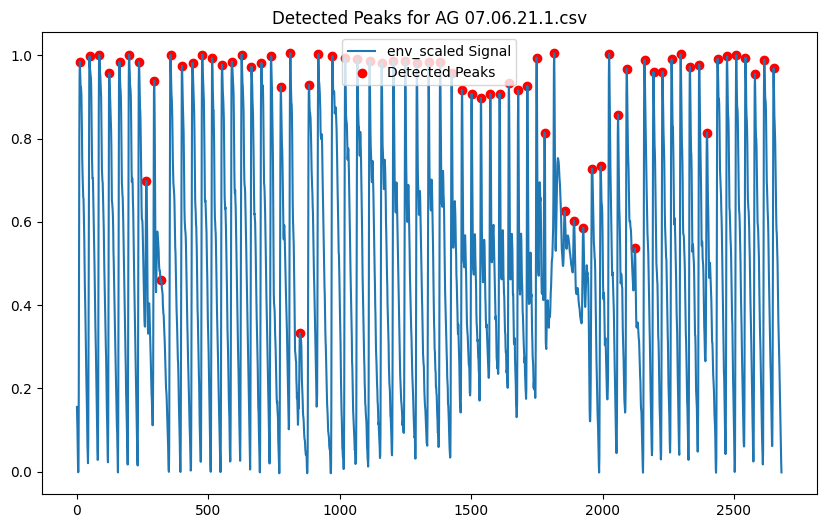

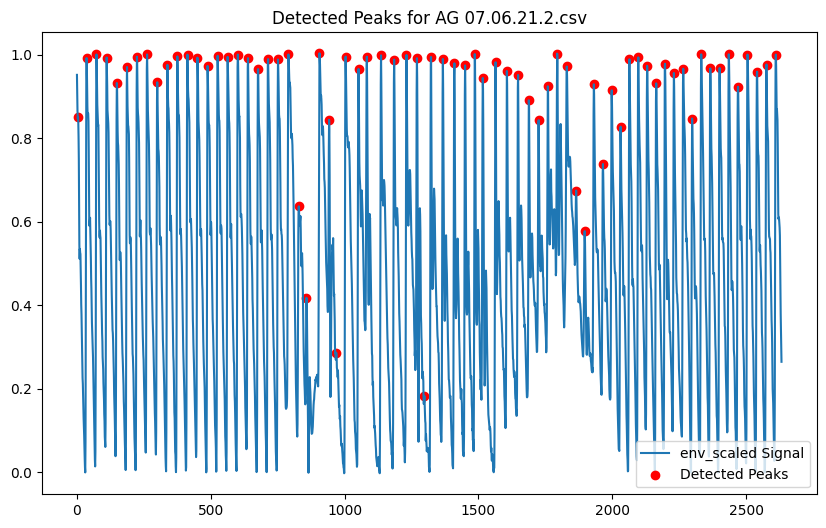

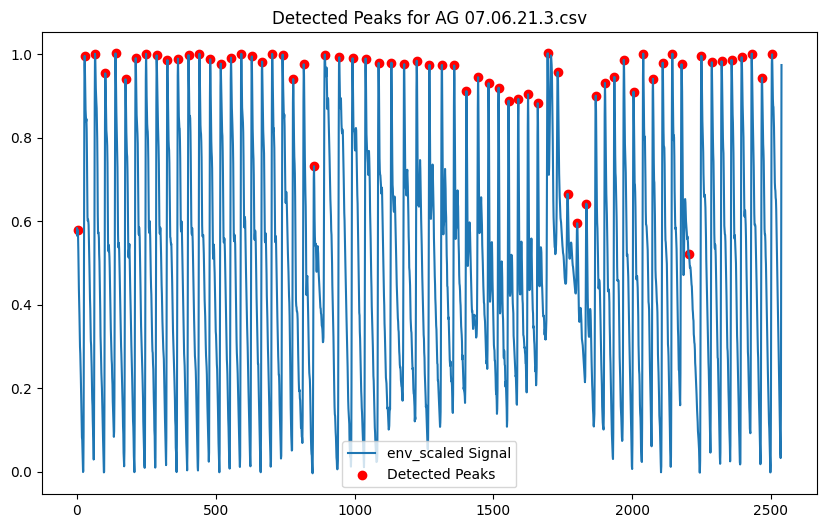

...

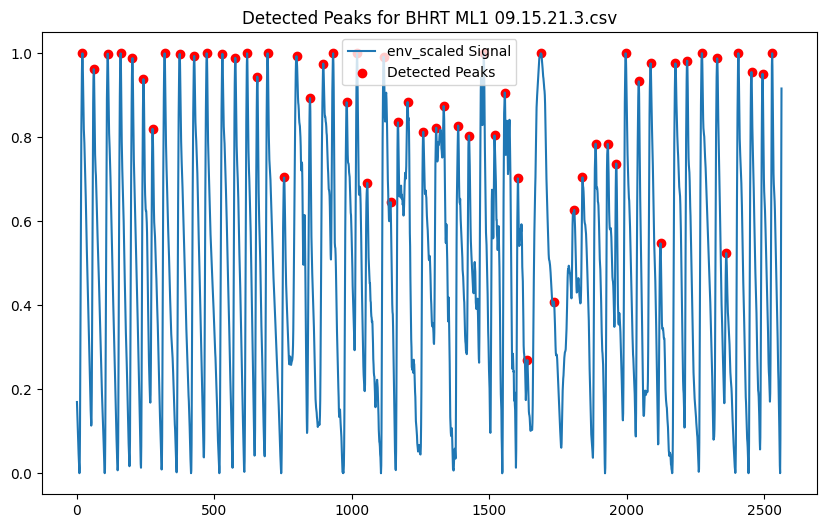

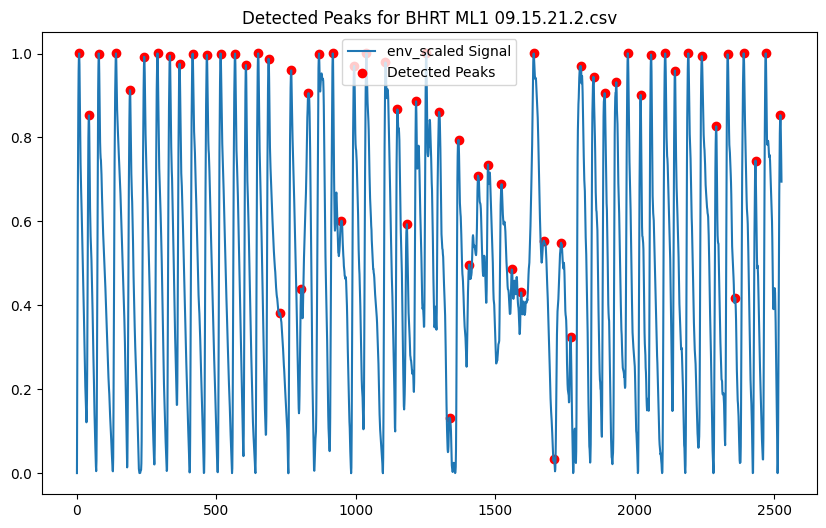

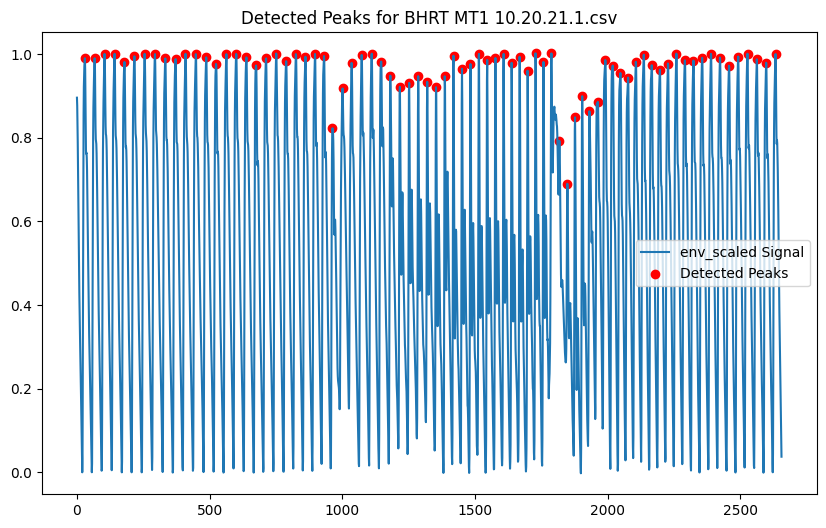

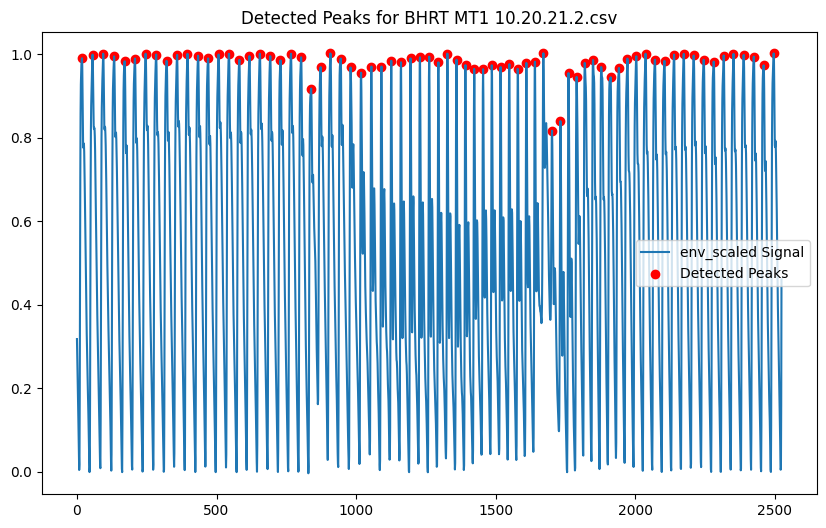

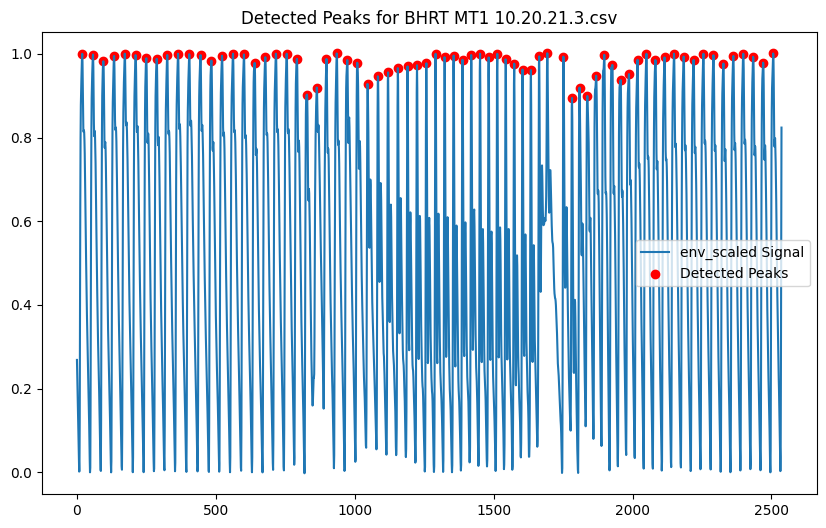

In [ ]:
for filename in selected_filenames:
    if filename not in ppg_signals_df:
        print(f"Warning: {filename} not found.")
        continue

    env_scaled = ppg_signals_df[filename]['env_scaled'].values

    # Detect peaks
    peaks, _ = scipy.signal.find_peaks(env_scaled, distance=25)

    # Debug: Plot detected peaks on the signal
    plt.figure(figsize=(10, 6))
    plt.plot(env_scaled, label='env_scaled Signal')
    plt.scatter(peaks, env_scaled[peaks], color='red', label='Detected Peaks')
    plt.legend()
    plt.title(f'Detected Peaks for {filename}')
    plt.show()


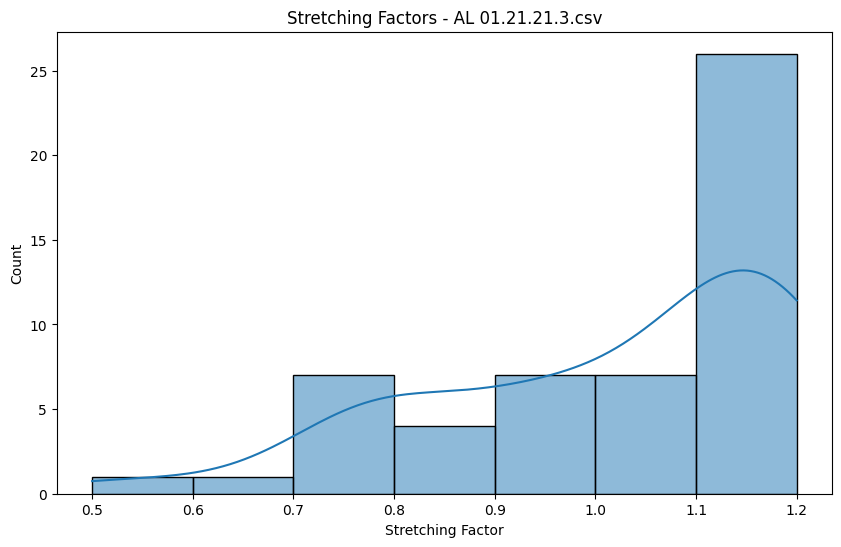

In [ ]:
# Plot stretching factors
plt.figure(figsize=(10, 6))
sns.histplot(example_factors, kde=True)
plt.title(f"Stretching Factors - {example_file}")
plt.xlabel("Stretching Factor")
plt.show()

## Plots

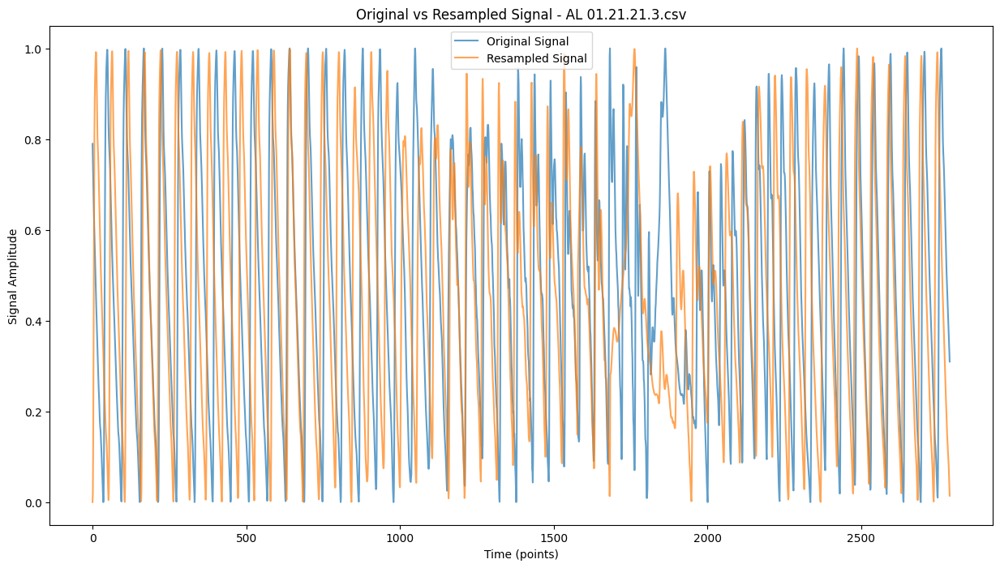

In [ ]:
original_signal = ppg_signals_df[example_file]['env_scaled'].values
full_resampled_signal = stretched_signals[example_file]

# Plot the original and resampled signals
plt.figure(figsize=(15, 8))

# Plot the original signal
plt.plot(original_signal, label='Original Signal', alpha=0.7)

# Plot the concatenated resampled signal
plt.plot(full_resampled_signal, label='Resampled Signal', alpha=0.7)

plt.title(f"Original vs Resampled Signal - {example_file}")
plt.xlabel("Time (points)")
plt.ylabel("Signal Amplitude")
plt.legend()
plt.show()


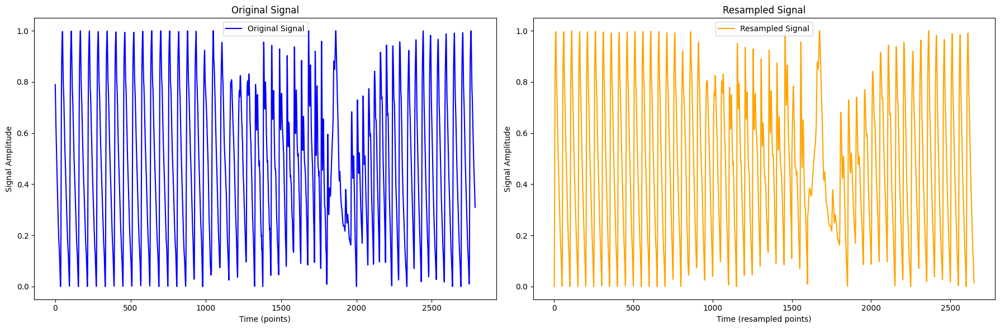

In [ ]:
original_signal = ppg_signals_df[example_file]['env_scaled'].values
full_resampled_signal = stretched_signals[example_file]

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Plot the original signal
axes[0].plot(original_signal, color='blue', label='Original Signal')
axes[0].set_title("Original Signal")
axes[0].set_xlabel("Time (points)")
axes[0].set_ylabel("Signal Amplitude")
axes[0].legend()

# Plot the resampled signal
axes[1].plot(full_resampled_signal, color='orange', label='Resampled Signal')
axes[1].set_title("Resampled Signal")
axes[1].set_xlabel("Time (resampled points)")
axes[1].set_ylabel("Signal Amplitude")
axes[1].legend()

plt.tight_layout()
plt.show()


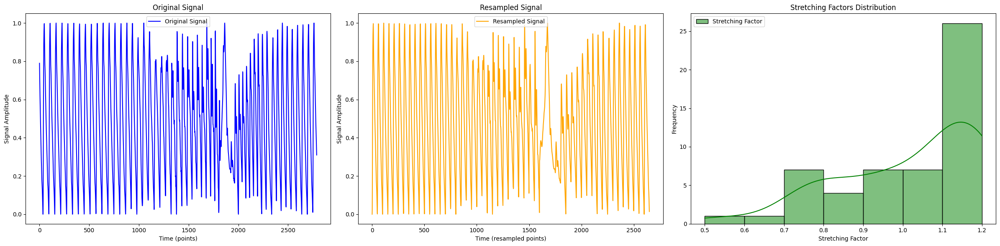

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Plot the original signal
axes[0].plot(original_signal, color='blue', label='Original Signal')
axes[0].set_title("Original Signal")
axes[0].set_xlabel("Time (points)")
axes[0].set_ylabel("Signal Amplitude")
axes[0].legend()

# Plot the resampled signal
axes[1].plot(full_resampled_signal, color='orange', label='Resampled Signal')
axes[1].set_title("Resampled Signal")
axes[1].set_xlabel("Time (resampled points)")
axes[1].set_ylabel("Signal Amplitude")
axes[1].legend()

# Plot the stretching factors as a histogram
sns.histplot(example_factors, kde=True, ax=axes[2], color='green', label='Stretching Factor')
axes[2].set_title("Stretching Factors Distribution")
axes[2].set_xlabel("Stretching Factor")
axes[2].set_ylabel("Frequency")
axes[2].legend()

plt.tight_layout()
plt.show()


# Multi Visuals

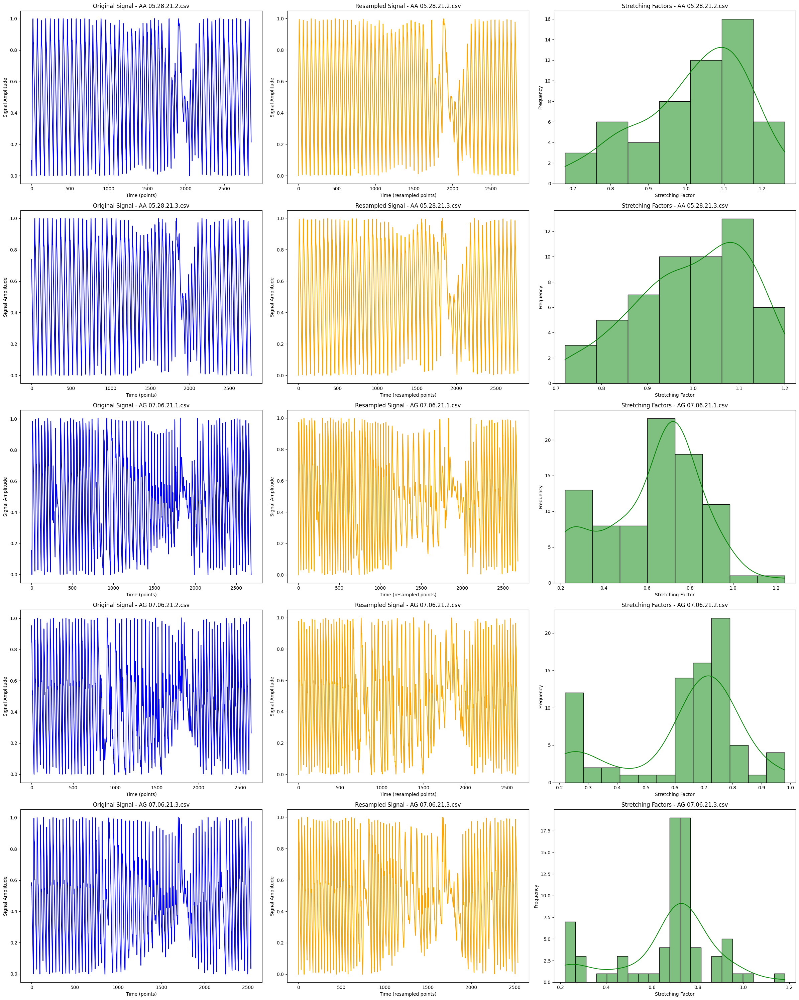

In [ ]:
num_files_to_visualize = 5
fig, axes = plt.subplots(num_files_to_visualize, 3, figsize=(24, 6 * num_files_to_visualize))

for idx, filename in enumerate(selected_filenames[:num_files_to_visualize]):
    if filename not in stretched_signals or filename not in stretching_factors:
        print(f"Warning: {filename} not processed.")
        continue

    # Original and resampled signals
    original_signal = ppg_signals_df[filename]['env_scaled'].values
    resampled_signal = stretched_signals[filename]
    factors = stretching_factors[filename]

    # Plot original signal
    axes[idx, 0].plot(original_signal, color='blue')
    axes[idx, 0].set_title(f"Original Signal - {filename}")
    axes[idx, 0].set_xlabel("Time (points)")
    axes[idx, 0].set_ylabel("Signal Amplitude")

    # Plot resampled signal
    axes[idx, 1].plot(resampled_signal, color='orange')
    axes[idx, 1].set_title(f"Resampled Signal - {filename}")
    axes[idx, 1].set_xlabel("Time (resampled points)")
    axes[idx, 1].set_ylabel("Signal Amplitude")

    # Plot stretching factors
    sns.histplot(factors, kde=True, ax=axes[idx, 2], color='green')
    axes[idx, 2].set_title(f"Stretching Factors - {filename}")
    axes[idx, 2].set_xlabel("Stretching Factor")
    axes[idx, 2].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

# multiple with substraction

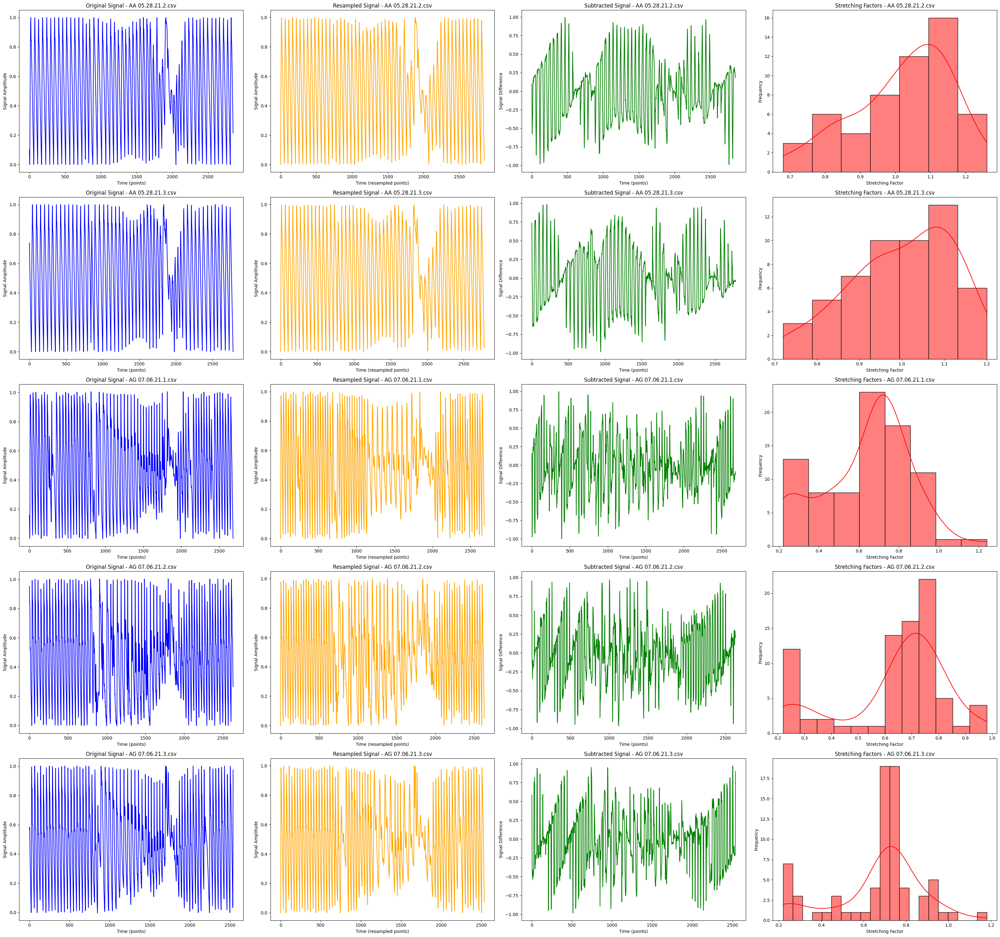

In [ ]:
num_files_to_visualize = 5
fig, axes = plt.subplots(num_files_to_visualize, 4, figsize=(32, 6 * num_files_to_visualize))

for idx, filename in enumerate(selected_filenames[:num_files_to_visualize]):
    if (filename not in stretched_signals or
        filename not in stretching_factors or
        filename not in subtracted_signals):
        print(f"Warning: {filename} not processed.")
        continue

    # Original and resampled signals
    original_signal = ppg_signals_df[filename]['env_scaled'].values
    resampled_signal = stretched_signals[filename]
    subtracted_signal = subtracted_signals[filename]
    factors = stretching_factors[filename]

    # Plot original signal
    axes[idx, 0].plot(original_signal, color='blue')
    axes[idx, 0].set_title(f"Original Signal - {filename}")
    axes[idx, 0].set_xlabel("Time (points)")
    axes[idx, 0].set_ylabel("Signal Amplitude")

    # Plot resampled signal
    axes[idx, 1].plot(resampled_signal, color='orange')
    axes[idx, 1].set_title(f"Resampled Signal - {filename}")
    axes[idx, 1].set_xlabel("Time (resampled points)")
    axes[idx, 1].set_ylabel("Signal Amplitude")

    # Plot subtracted signal
    axes[idx, 2].plot(subtracted_signal, color='green')
    axes[idx, 2].set_title(f"Subtracted Signal - {filename}")
    axes[idx, 2].set_xlabel("Time (points)")
    axes[idx, 2].set_ylabel("Signal Difference")

    # Plot stretching factors
    sns.histplot(factors, kde=True, ax=axes[idx, 3], color='red')
    axes[idx, 3].set_title(f"Stretching Factors - {filename}")
    axes[idx, 3].set_xlabel("Stretching Factor")
    axes[idx, 3].set_ylabel("Frequency")

plt.tight_layout()
plt.show()